# The Project

# Advance Lane finding
## by Felipe Rojas

## The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

I will use Functions from the Drawing Functions library from OpenCV to Draw the polygon (with polylines), to fill the road image (with polyFill) and to add Text to an image (with putText).
https://docs.opencv.org/2.4/modules/core/doc/drawing_functions.html

In [23]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Camera Calibration
First, I will define a function for the camera calibration

In [31]:
def camera_cal(chess_size):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((chess_size[0]*chess_size[1],3), np.float32)
    objp[:,:2] = np.mgrid[0:chess_size[0], 0:chess_size[1]].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images.
    # The function will return these arrays for the CV2 undistortion function
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    # A list with all the chessboard images
    images = glob.glob('camera_cal/calibration*.jpg')
    
    # Cycle through the list
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (chess_size[0],chess_size[1]), None)
    
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (chess_size[0],chess_size[1]), corners, ret)
            #write_name = 'corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
            cv2.waitKey(500)
    
    cv2.destroyAllWindows()
    return objpoints, imgpoints

Now I use the function to obtain the object points and image points for the undistortion function, The function only requieres the chess size, in this case, 9 by 6

In [137]:
obj_p, img_p = camera_cal((9,6))

The next function takes the image I want to undistort, and the image points and object points from the previous function.
I will test the function with a chess board, and then with one of the Test images

In [48]:
def undistort(img, obj_p, img_p):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_p, img_p, img_size,None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Side by side images of the original image with the undistorted image
    '''
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=30)
    '''
    
    return undist

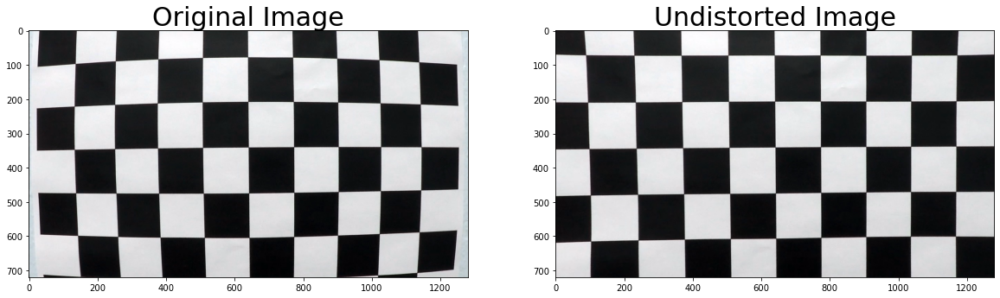

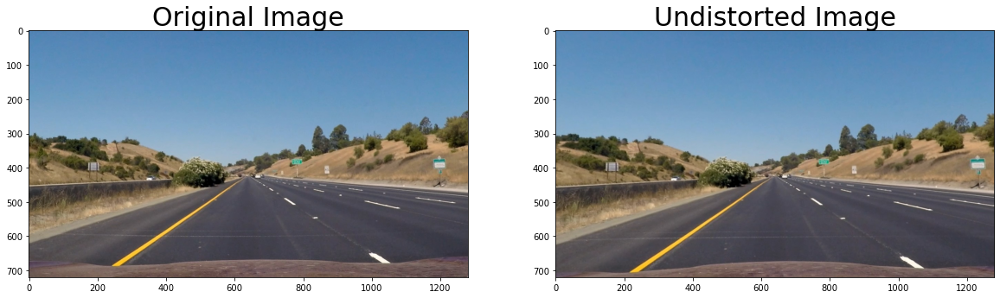

In [39]:
# Test undistortion function on an chessboard image
img_test = cv2.imread('camera_cal/calibration1.jpg') #I'll undistort the first image 
undist = undistort(img_test, obj_p, img_p)

# Now, lets undistort one of the test images
img = mpimg.imread('test_images/straight_lines1.jpg')
undist = undistort(img, obj_p, img_p)

# Color and Gradient Transformation
## I will try different color and gradient thresholds for the lane detection

For color Transformation, I will use the S channel from the HLS color transformation

In [33]:
def hls_threshold(image, thresh_s=(160,255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    s_binary = np.zeros_like(S)
    s_binary[(S > thresh_s[0]) & (S <= thresh_s[1])] = 1
    return s_binary

For the Gradient transformation, I will use Absolute sobel in X axis, Magnitude sobel with both X and Y axis and the Direction Threshold.

Then I will build a function that combines these transformation in one image

In [44]:
def abs_sobel(img, thresh=(0, 255), orient='x'):
    
    # 1) Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'x'):
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
         # 3) Take the absolute value of the derivative or gradient
        abs_sobelx = np.absolute(sobelx)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    elif(orient == 'y'):
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
         # 3) Take the absolute value of the derivative or gradient
        abs_sobely = np.absolute(sobely)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    else:
        print("not a valid orientation")
        
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_gradient = np.uint8(255*gradient_magnitude/np.max(gradient_magnitude))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_gradient)
    binary_output[(scaled_gradient >= mag_thresh[0]) & (scaled_gradient <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    gradient_direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(gradient_direction)
    binary_output[(gradient_direction >= thresh[0]) & (gradient_direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output    

def combined_threshold(img, thresh_s, abs_threshold, mag_threshold, dir_threshold, kernel_size = 3):
    
    # Apply each of the thresholding functions
    gradx = abs_sobel(img, abs_threshold, orient='x')
    #plt.imshow(gradx, cmap = 'gray')
    grady = abs_sobel(img, abs_threshold, orient='y')
    #plt.imshow(gradx, cmap = 'gray')
    mag_binary = mag_thresh(img, kernel_size, mag_threshold)
    #plt.imshow(mag_binary, cmap = 'gray')
    dir_binary = dir_thresh(img, kernel_size, dir_threshold)
    #plt.imshow(dir_binary, cmap = 'gray')
    s_binary = hls_threshold(img, thresh_s)
    combined = np.zeros_like(dir_binary)
    combined[ ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (s_binary == 1) ] = 1
    '''
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    '''
    
    return combined

I will try different Thresholds for the different methods and see which ones return better results. The final image will be saved in a new variable

First the HLS Threshold

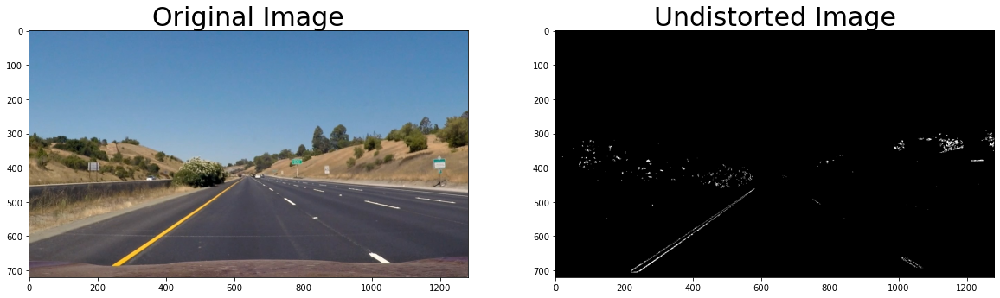

In [142]:
img = mpimg.imread('test_images/straight_lines1.jpg')
undist = undistort(img, obj_p, img_p)
S_channel = hls_threshold(undist, thresh_s=(140,200))
plt.imshow(S_channel, cmap='gray')

Next, the Absolute Threshold

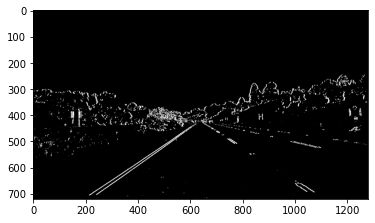

In [143]:
abs_image = abs_sobel(undist, thresh=(30, 200), orient='x')
plt.imshow(abs_image, cmap='gray')

Now, the Magnitude Threshold

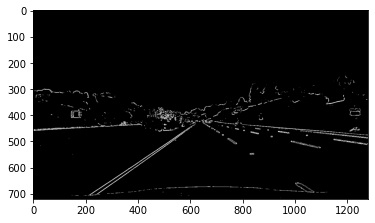

In [144]:
mag_image = mag_thresh(undist,sobel_kernel=3, mag_thresh=(70, 170))
plt.imshow(mag_image, cmap='gray')

Finally, the Direction Threshold

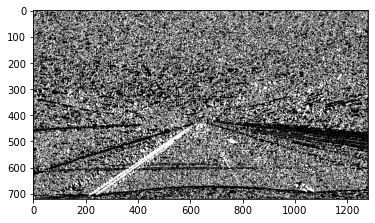

In [145]:
dir_image = dir_thresh(undist, sobel_kernel=9, thresh=(0.3, 1.1))
plt.imshow(dir_image, cmap='gray')

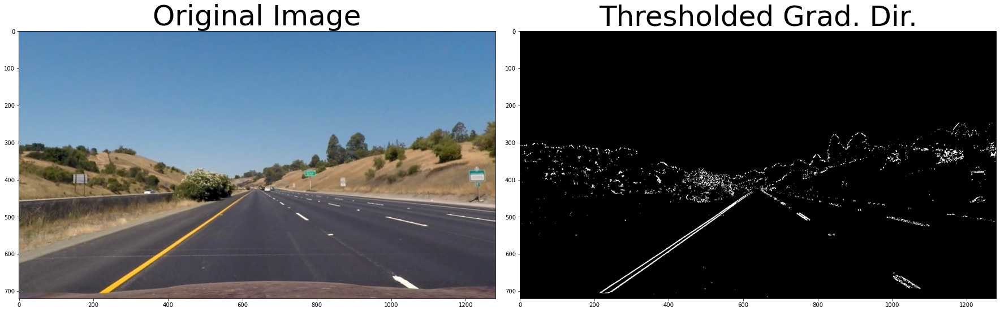

In [146]:
grad_image = combined_threshold(undist, thresh_s = (140,200), abs_threshold=(30, 200), mag_threshold=(70, 170), dir_threshold=(0.3, 1.1), kernel_size=3)

# Perspective Transformation
## The next step is to transform the image to a Bird-View Perspective of the road

For this, I will define a function that draw a polygon of the Area of Interest. Then, according to the points used to draw the polygon, I will define a new function that Transform the image from the Source points to the Destination Points

In [46]:
def AreaofInterest(img, botleft,topleft, topright, botright):
    
    # Now I will draw a polygon to see which is the Area that I will transform
    vertices = np.array([[botleft,topleft, topright, botright]], 'int32')
    image_copy = np.copy(img)
    cv2.polylines(image_copy, vertices, True, color = (255,0,0), thickness = 2)
    return image_copy

def persp_transfor(image, src_points, dst_points):
    imshape = (image.shape[1], image.shape[0])
    M = cv2.getPerspectiveTransform(src_points, dst_points) 
    Minv = cv2.getPerspectiveTransform(dst_points, src_points)
    warped = cv2.warpPerspective(image, M, imshape, flags=cv2.INTER_LINEAR)
    '''
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    '''
    return warped

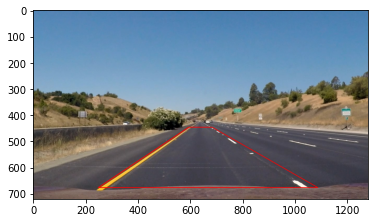

In [40]:
# I will define the points of the source polygon I am going to transform
# I will do this in a function that will return the original image with the
# polygon drawn.
imshape = (img.shape[1], img.shape[0])
bottom_left = [int(imshape[0]*0.195), int(imshape[1]*0.94)]
bottom_right = [int(imshape[0]*0.85), int(imshape[1]*0.94)]
top_left = [int(imshape[0]*0.465), int(imshape[1]*0.62)]
top_right = [int(imshape[0]*0.535), int(imshape[1]*0.62)]

aoi_image = AreaofInterest(img, bottom_left,top_left, top_right, bottom_right)
plt.imshow(aoi_image)

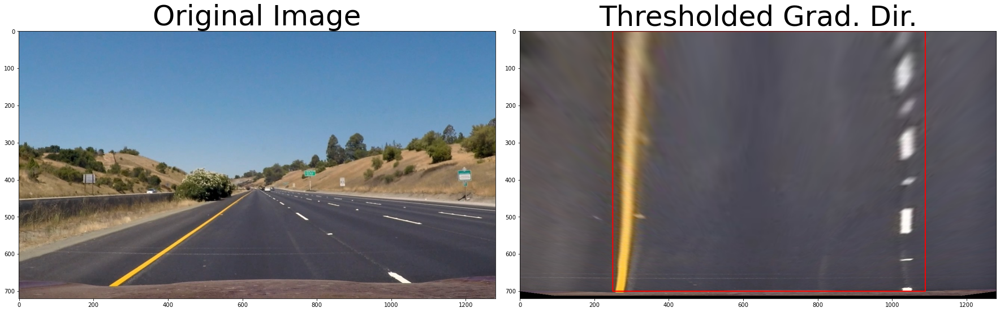

In [149]:
# When I am satisfied with the Area over the road, I will the apply the Perspective 
# Transformation. First, I will define both the source points and the destination
# points for the function
src_points = np.float32([bottom_left, top_left, top_right, bottom_right])
dst_points = np.float32([[bottom_left[0], 700], [bottom_left[0], 0], [bottom_right[0], 0], [bottom_right[0], 700]])
warped_image = persp_transfor(img, src_points, dst_points)
aoi_image2 = AreaofInterest(warped_image, [bottom_left[0], 700], [bottom_left[0], 0], [bottom_right[0], 0], [bottom_right[0], 700])
plt.imshow(aoi_image2)

Once I see a good transformation, I apply it to the Gradient Image with the white Lane Lines

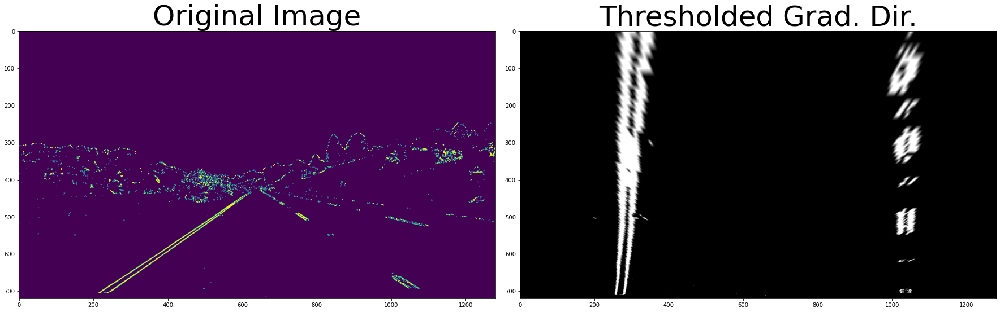

In [150]:
warped_grad = persp_transfor(grad_image, src_points, dst_points)

# Now, Let's test the code so far with different images

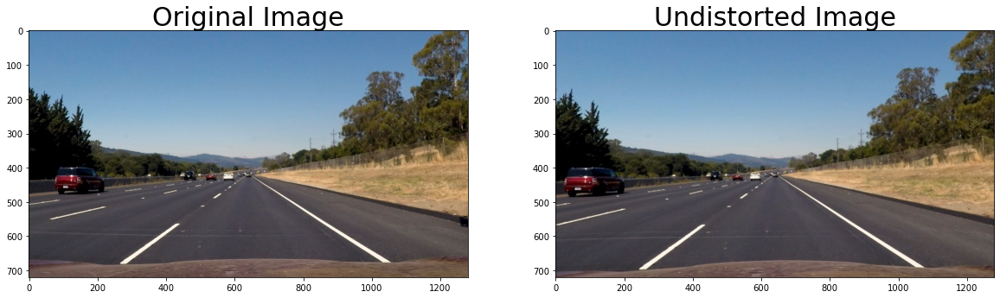

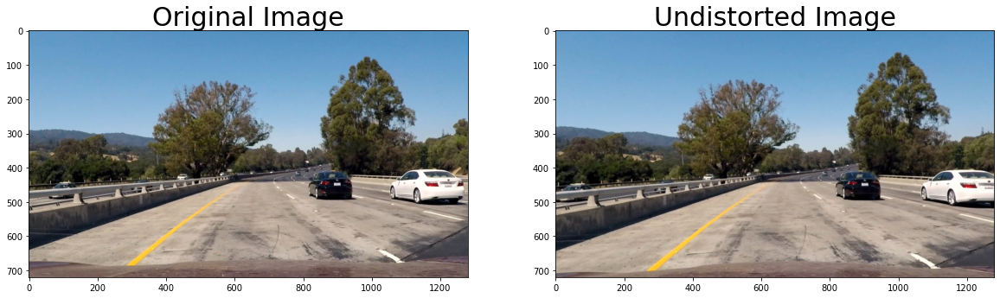

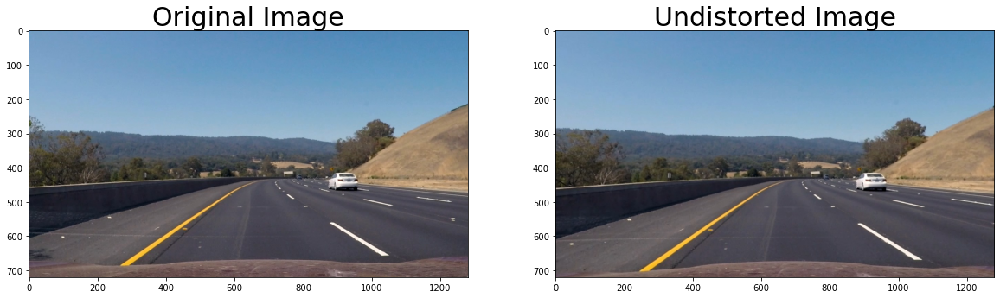

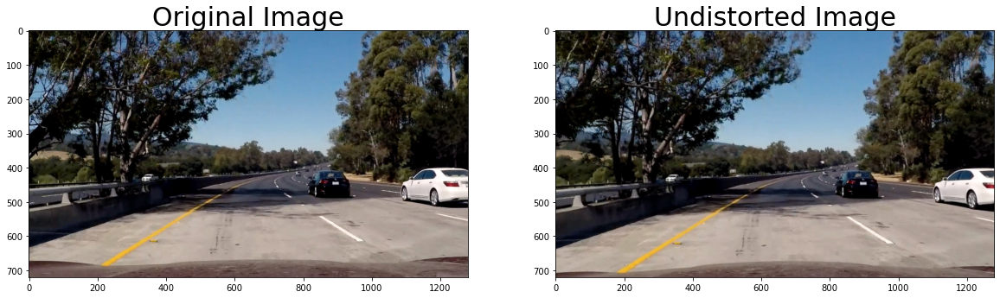

In [152]:
img2 = mpimg.imread('test_images/straight_lines2.jpg')
undist2 = undistort(img2, obj_p, img_p)

img3 = mpimg.imread('test_images/test1.jpg')
undist3 = undistort(img3, obj_p, img_p)

img4 = mpimg.imread('test_images/test3.jpg')
undist4 = undistort(img4, obj_p, img_p)

img5 = mpimg.imread('test_images/test5.jpg')
undist5 = undistort(img5, obj_p, img_p)

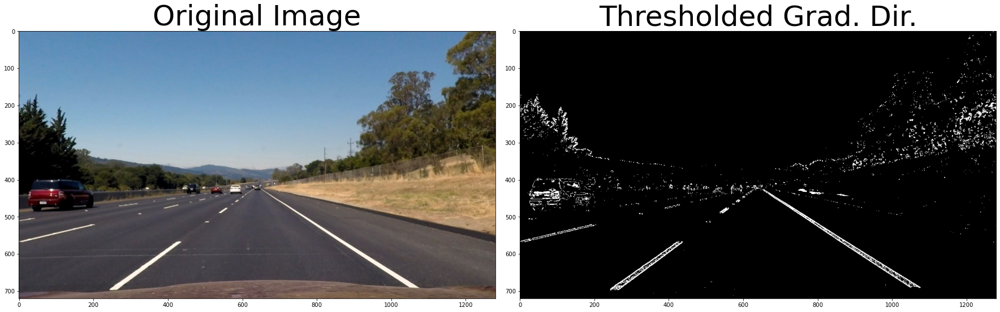

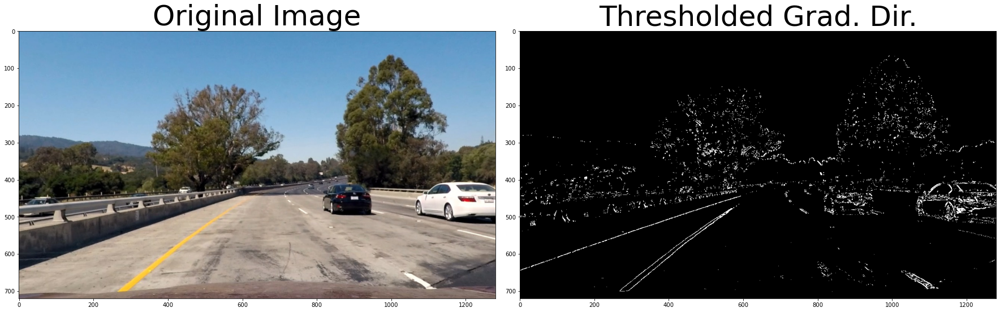

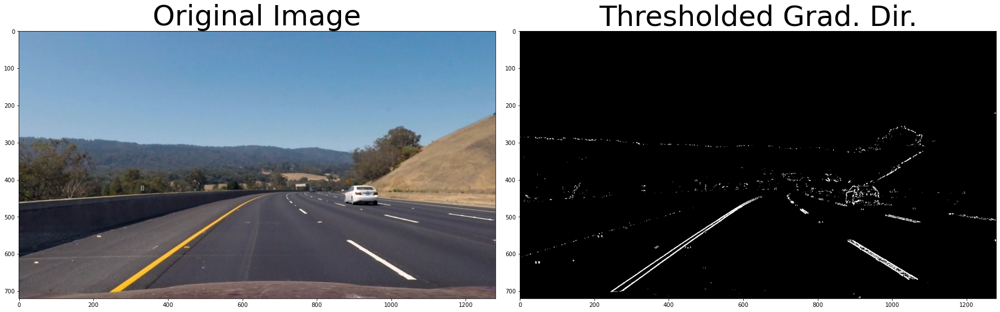

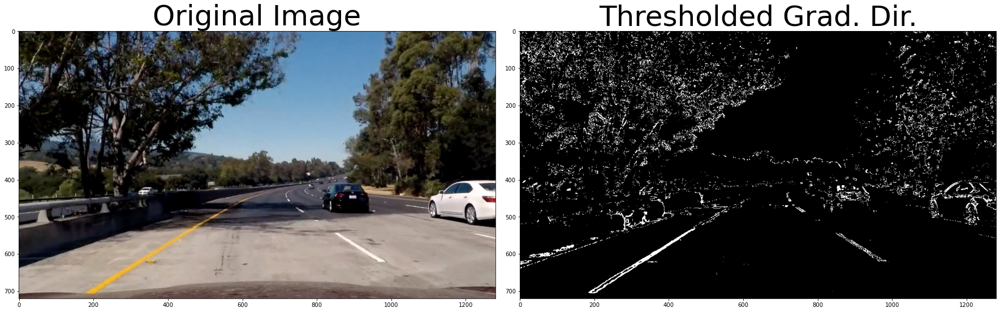

In [153]:
grad_image2 = combined_threshold(undist2, thresh_s = (160,220), abs_threshold=(30, 200), mag_threshold=(90, 190), dir_threshold=(0.2, 0.9), kernel_size=3)
grad_image3 = combined_threshold(undist3, thresh_s = (160,220), abs_threshold=(30, 200), mag_threshold=(90, 190), dir_threshold=(0.2, 0.9), kernel_size=3)
grad_image4 = combined_threshold(undist4, thresh_s = (160,220), abs_threshold=(30, 200), mag_threshold=(90, 190), dir_threshold=(0.2, 0.9), kernel_size=3)
grad_image5 = combined_threshold(undist5, thresh_s = (160,220), abs_threshold=(30, 200), mag_threshold=(90, 190), dir_threshold=(0.2, 0.9), kernel_size=3)

## I tried to use percentages so I get the road in all kind of images. 
I had to change the Source points so it could fit all the images

In [154]:
imshape = (img.shape[1], img.shape[0])
bottom_left = [int(imshape[0]*0.195), int(imshape[1]*0.94)]
bottom_right = [int(imshape[0]*0.85), int(imshape[1]*0.94)]
top_left = [int(imshape[0]*0.465), int(imshape[1]*0.62)]
top_right = [int(imshape[0]*0.535), int(imshape[1]*0.62)]

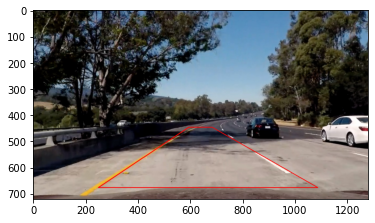

In [155]:
aoi_image2 = AreaofInterest(undist2, bottom_left,top_left, top_right, bottom_right)
#plt.imshow(aoi_image2)

aoi_image3 = AreaofInterest(undist3, bottom_left,top_left, top_right, bottom_right)
#plt.imshow(aoi_image3)

aoi_image4 = AreaofInterest(undist4, bottom_left,top_left, top_right, bottom_right)
#plt.imshow(aoi_image4)

aoi_image5 = AreaofInterest(undist5, bottom_left,top_left, top_right, bottom_right)
plt.imshow(aoi_image5)

Now, It is time to test the Perspective Transformation with the Gradient Threshold to all the images

In [156]:
src_points = np.float32([bottom_left, top_left, top_right, bottom_right])
dst_points = np.float32([[bottom_left[0], 720], [bottom_left[0], 0], [bottom_right[0], 0], [bottom_right[0], 720]])

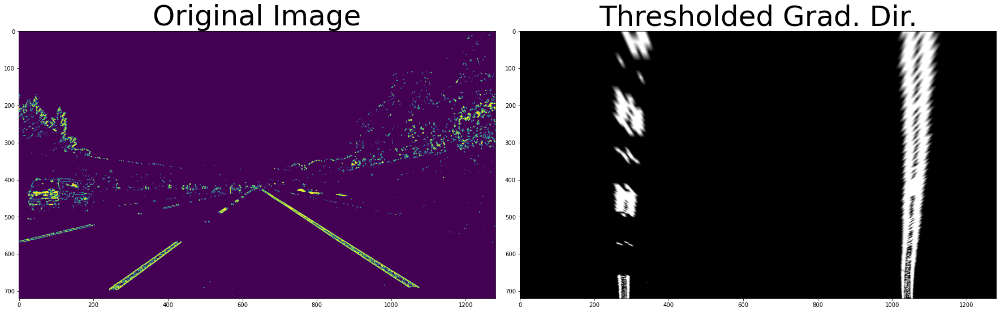

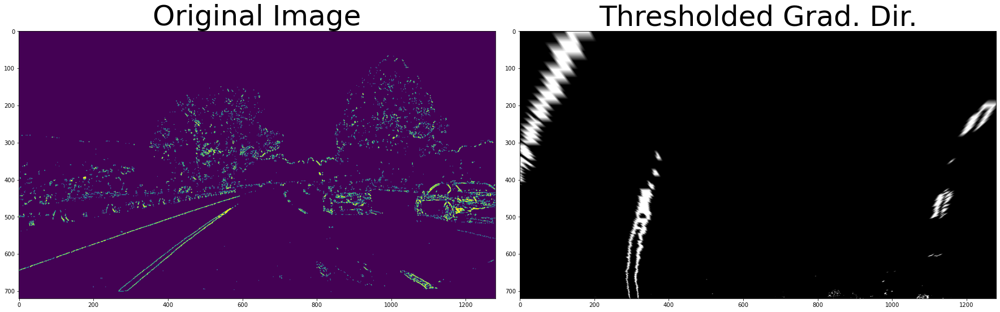

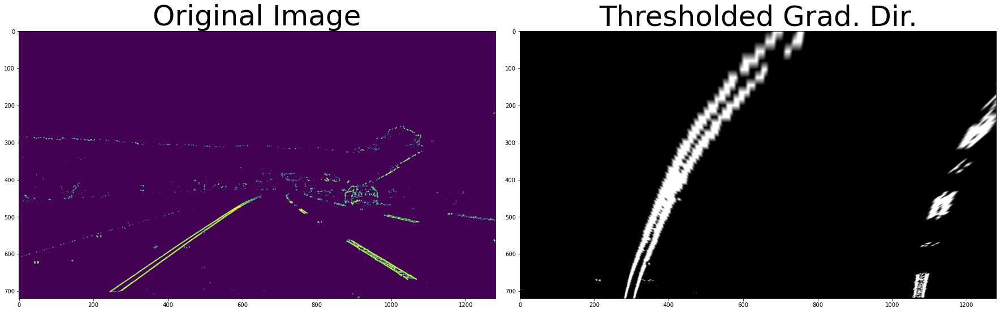

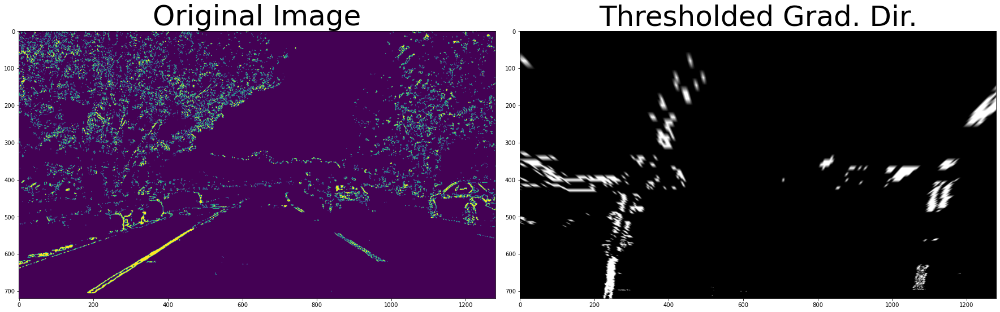

In [157]:
warped_grad2 = persp_transfor(grad_image2, src_points, dst_points)
warped_grad3 = persp_transfor(grad_image3, src_points, dst_points)
warped_grad4 = persp_transfor(grad_image4, src_points, dst_points)
warped_grad5 = persp_transfor(grad_image5, src_points, dst_points)

# Now, I will try to detect the lanes by using Histograms

So far, so good. Now it's time to detect the lanes on each image.
For the images, we will do a full image scan for the lane pixels.
For videos, the first frame will have a full image scan, but after that the scan will be in the zones where the previous line was detected

I will be using the Test5.jpg because this image gave me some trouble

In [9]:
def find_lane_pixels(image,  nwin=2, margin = 100, min_pix = 50):
    
    hist = np.sum(image[image.shape[0]//2:,:], axis=0)
    # Create the Output image variable
    out_img = np.dstack((image, image, image))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(hist.shape[0]//2)
    leftx_base = np.argmax(hist[:midpoint])
    rightx_base = np.argmax(hist[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(image.shape[0]//nwin)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwin):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = image.shape[0] - (window+1)*window_height
        win_y_high = image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > min_pix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > min_pix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img    

def fit_polynomial(image,  nwin=2, margin = 100, min_pix = 50):
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(image,  nwin, margin, min_pix)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Plots the left and right polynomials on the lane lines
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

    return out_img, left_fit, right_fit



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


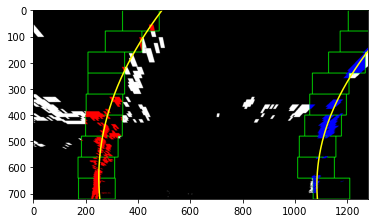

In [159]:
poly_image5, left_fit5, right_fit5 = fit_polynomial(warped_grad5,  nwin=9, margin = 70, min_pix = 50)

## Drawing the lanes
#### Now, I will define a function that takes the second Grade polynomial coefficients and fill a polygon in the Bird-view Perspective image. After this, I will perform an inverse Perspective Transformation to get the Road image back to the original perspective with the lane drawn over it.

In [11]:
def draw_lanes(og_image, grad_image, left_fit, right_fit, src_points, dst_points):
    ploty = np.linspace(0, og_image.shape[0]-1, num = og_image.shape[0] )
    mask = np.zeros_like(grad_image).astype(np.uint8)
    color_mask = np.dstack((mask, mask, mask))
    # For the function fillPolly, we need an array of the points
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_mask, np.int_([pts]), (0,255, 0))
    Minv = cv2.getPerspectiveTransform(dst_points, src_points)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_mask, Minv, (og_image.shape[1], og_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(og_image, 1, newwarp, 0.3, 0)
    #plt.imshow(result)
    return result, ploty

Let's see the result of this image.

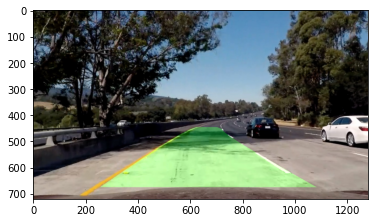

In [161]:
lanes_image5, ploty = draw_lanes(undist5, warped_grad5,left_fit5, right_fit5, src_points, dst_points)

Looks great!

Now I need to calculate the radius of curvature and the car offset. I will use a single function for both operations

### Radius of curvarute

For the radius of curvature I will be using the following convertion from pixels for meters: 

* ym_per_pix = 30/720  meters per pixel in y dimension
* xm_per_pix = 3.7/700 meters per pixel in x dimension

I am using the A B C coefficients from the left_fit and right_fit and build again a square polynomial. I will calculate the average of both lanes to get one line in the middle of the road, and use it for the radius calculation. 

Then, I will convert the polynomial from pixels to meters and use the R_curvature calculation from the lesson to get a radius of curvature in meters.
Finally, with the putText functions from the cv2 Libraries, I will show the results in the original image.

### Car Offset

For the car offset from the lane I will assume that the middle of the image is the middle of the car.

Knowing this, I can calculate the X values of the square polynomial at the bottom of the image (Y = max Value, in this case 720) for each lane. To get the center of the road, I will just add both X values and divide by 2.

Again, I will add this information as Text to the original image

In [12]:
def curv_offset(og_image, left_fit, right_fit, ploty):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    ploty = np.linspace(0, og_image.shape[0]-1, num = og_image.shape[0] )
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    #### Implement the calculation of R_curve (radius of curvature) #####
    left_curv = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    average_rad = (left_curv + right_curv)/2
    average_rad = "Radius of Curvature: %.2f m" % average_rad
    cv2.putText(og_image,average_rad , (150, 300), cv2.FONT_HERSHEY_SIMPLEX, 1.4, (255,255,0), thickness=3)
    
    car_pos_y = og_image.shape[0]
    #I will look for X position when the Y in at the max value (the car position, or the bottom of the image)
    left_fit_bottom = left_fit[0]*car_pos_y**2 + left_fit[1]*car_pos_y + left_fit[2]
    right_fit_bottom = right_fit[0]*car_pos_y**2 + right_fit[1]*car_pos_y + right_fit[2]
    # Now I will get the average of both X values to get the Center of the lane.
    lane_center = (left_fit_bottom + right_fit_bottom)/2.
    # Assuming the center of the image is where the car is, I will compare it to the Center of the lane
    #If the result is positive, the Car offset is to the right, if the result is negative the car offset is to the left
    offset_pix = og_image.shape[1]/2 - lane_center 
    # Scale the result to meters
    offset_m = offset_pix*xm_per_pix
    offset_m = "Car Offset:%.2f m" %offset_m
    cv2.putText(og_image,offset_m , (150, 360), cv2.FONT_HERSHEY_SIMPLEX, 1.4, (255,255,0), thickness=3)
    #plt.imshow(og_image)
    return og_image

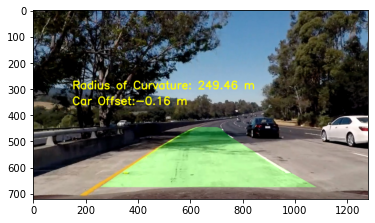

In [163]:
final_image5 = curv_offset(lanes_image5, left_fit5, right_fit5, ploty)

### Looks good!

The next part is to define a function that I will use for the video input. This will take an image, and return the image with the road lane in green and the curvature and offset detected.

I found some trouble passing the variables from function to function, specially with the find lane pixels function and the poly fit. So, instead of using separate functions, I will include them directly in this function.

In [41]:
def advance_lane_detect(img): 
    undist = undistort(img, obj_p, img_p)
    grad_image = combined_threshold(undist, thresh_s = (140,200), abs_threshold=(30, 200), mag_threshold=(70, 170), dir_threshold=(0.3, 1.1), kernel_size=3)
    # Points for the Source points and Destination points
    imshape = (img.shape[1], img.shape[0])
    bottom_left = [int(imshape[0]*0.195), int(imshape[1]*0.94)]
    bottom_right = [int(imshape[0]*0.85), int(imshape[1]*0.94)]
    top_left = [int(imshape[0]*0.465), int(imshape[1]*0.62)]
    top_right = [int(imshape[0]*0.535), int(imshape[1]*0.62)]
    src_points = np.float32([bottom_left, top_left, top_right, bottom_right])
    dst_points = np.float32([[bottom_left[0], 720], [bottom_left[0], 0], [bottom_right[0], 0], [bottom_right[0], 720]])
    
    warped_grad = persp_transfor(grad_image, src_points, dst_points)
    
    # Here I will do all the lane pixel detection, step by step, without calling another function
    # First, use the Histogram method the see where the lanes are
    hist = np.sum(warped_grad[warped_grad.shape[0]//2:,:], axis=0)
    out_img = np.dstack((warped_grad, warped_grad, warped_grad))*255
    midpoint = np.int(hist.shape[0]//2)
    leftx_base = np.argmax(hist[:midpoint])
    rightx_base = np.argmax(hist[midpoint:]) + midpoint

    # HyperParameters
    nwin = 9
    # Set height of windows
    window_height = np.int(warped_grad.shape[0]//nwin)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_grad.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 70
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwin):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_grad.shape[0] - (window+1)*window_height
        win_y_high = warped_grad.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = warped_grad.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 60
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_grad.shape[0]-1, warped_grad.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped_grad, warped_grad, warped_grad))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    ### Here ends the  Poly Fit Function
    # Now, it is time to draw the lanes
    lanes_image, ploty = draw_lanes(undist, warped_grad,left_fit, right_fit, src_points, dst_points)
    
    # Get the radius of curvature and offset
    final_image = curv_offset(lanes_image, left_fit, right_fit, ploty)
    
    return final_image

Let's see the final result with different images!
Always do the Camera Calibration first, we need the object and image points!

In [25]:
global obj_p, img_p
obj_p, img_p = camera_cal(chess_size = (9,6))   #The chess joints are 9 horizontal and 6 vertical

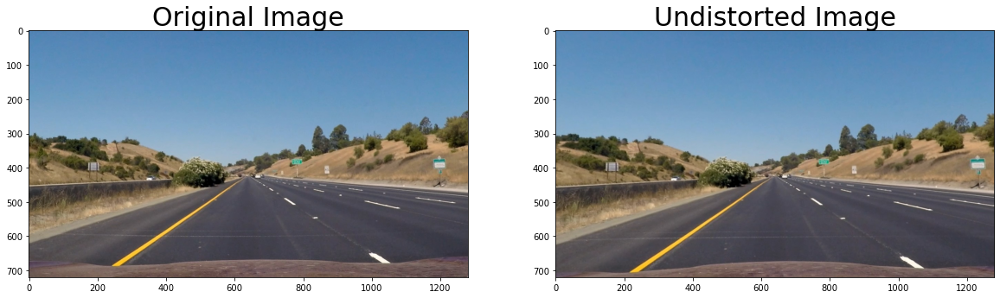

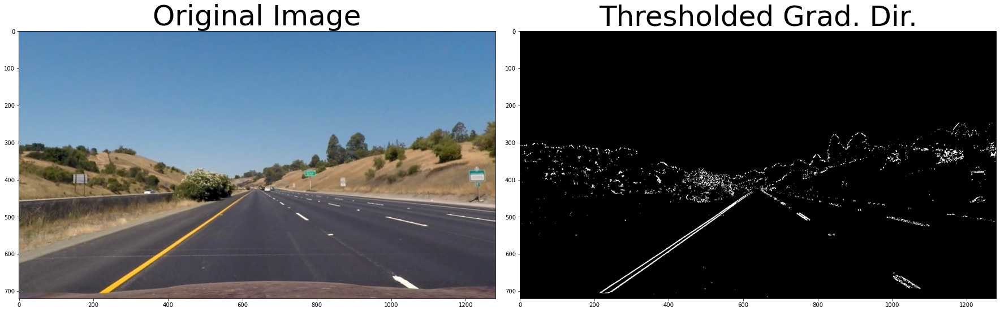

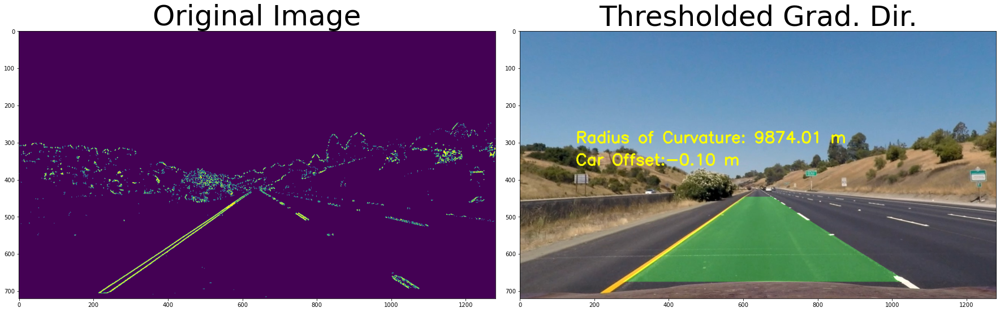

In [174]:
# The object points and image points will be used from now on
image1 = mpimg.imread('test_images/straight_lines1.jpg')
final_image1 = advance_lane_detect(image1)
mpimg.imsave("output_images/straight_lines1_output.png", final_image1)

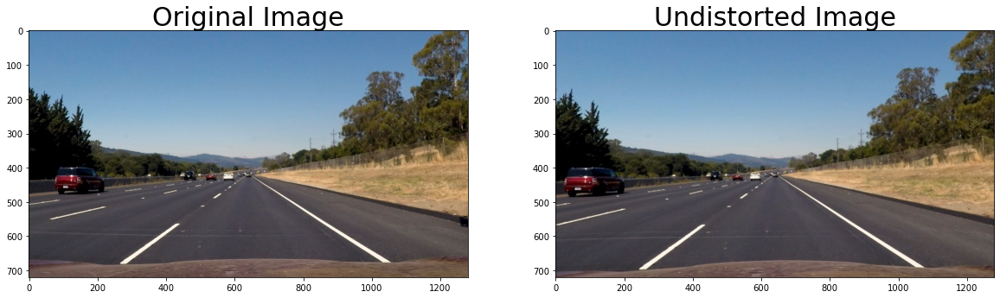

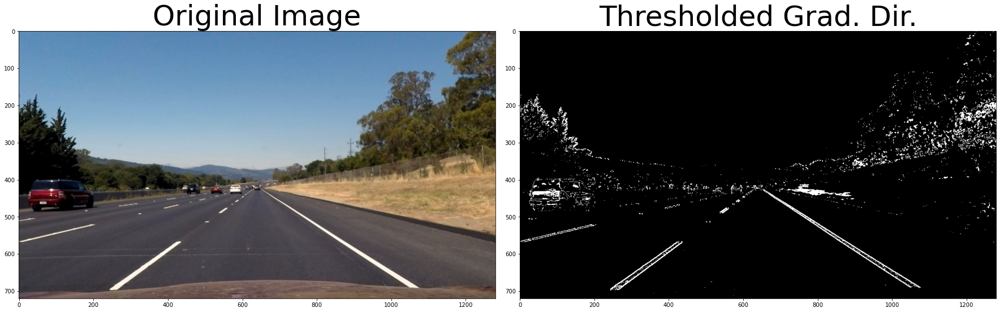

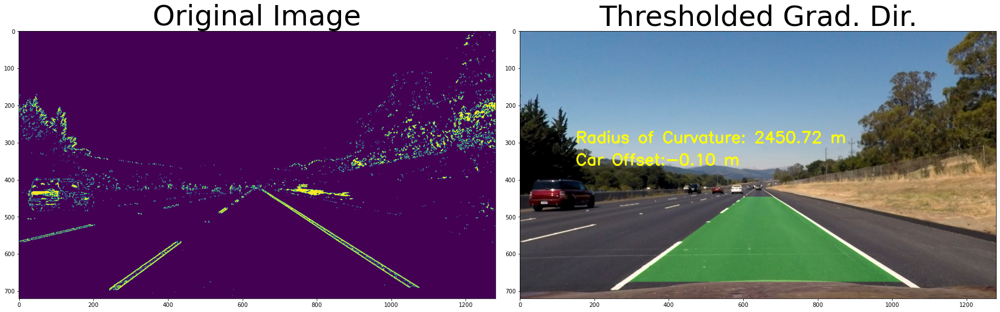

In [175]:
# The object points and image points will be used from now on
image2 = mpimg.imread('test_images/straight_lines2.jpg')
final_image2 = advance_lane_detect(image2)
mpimg.imsave("output_images/straight_lines1_output.png", final_image2)

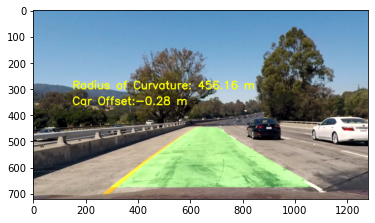

In [50]:
# The object points and image points will be used from now on
image3 = mpimg.imread('test_images/test1.jpg')
final_image3 = advance_lane_detect(image3)
mpimg.imsave("output_images/test1_output.png", final_image3)
plt.imshow(final_image3)

### Video Input
Finally the video part!
For this part, I had to comment out all the plots in the functions so I had no errors.


In [51]:
from moviepy.editor import VideoFileClip

video_output = 'output_images/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(advance_lane_detect) #NOTE: this function expects color images!!
video_clip.write_videofile(video_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_images/project_video.mp4.
Moviepy - Writing video output_images/project_video.mp4



Moviepy - Done !
Moviepy - video ready output_images/project_video.mp4


Great! Now I will try with the first challenge video!

In [ ]:
video_output = 'output_images/project_video.mp4'
clip2 = VideoFileClip("challenge_video.mp4")
video_clip = clip2.fl_image(advance_lane_detect) #NOTE: this function expects color images!!
video_clip.write_videofile(video_output, audio=False)